<a href="https://colab.research.google.com/github/devyanipatharkar/ML-Bootcamp/blob/master/Copy_of_SAR_person_detection_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Wed Apr  9 12:58:10 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   31C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content/datasets


In [ ]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.3.105 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.8/112.6 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

## Custom Training

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="AAdiF5OFN6d0n8XKP8RA")
project = rf.workspace("arena-c2er0").project("sar-dataset-ei8wj")
version = project.version(1)
dataset = version.download("yolov8")



/content/datasets/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to SAR-dataset-1 in yolov8:: 100%|██████████| 6748/6748 [00:02<00:00, 3349.60it/s]


In [ ]:
content = """
names:
- person
nc: 1
roboflow:
  license: CC BY 4.0
  project: sar-dataset-ei8wj
  url: https://universe.roboflow.com/arena-c2er0/sar-dataset-ei8wj/dataset/1
  version: 1
  workspace: arena-c2er0
test: ../test/images
train: ../SAR-dataset-1/train/images
val: ../SAR-dataset-1/valid/images


"""

In [ ]:

%cd {HOME}/datasets/SAR-dataset-1
with open('data.yaml', 'w') as f:
  f.write(content)


/content/datasets/datasets/SAR-dataset-1


In [ ]:
logger = 'Comet'

if logger == 'Comet':
  %pip install -q comet_ml
  from comet_ml import Experiment
  experiment = Experiment(
      api_key="fruKrMzNgElSqBXTSqoQ2J13V",
      project_name="yolov8",
    workspace="devyanipatharkar")

elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch.


In [ ]:
%pip install -q clearml
import clearml
clearml.browser_login()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs/detect/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# %reload_ext tensorboard

In [ ]:
%cd {HOME}

!yolo task=detect mode=train epochs=100 batch=36 model=yolov8n.yaml data={dataset.location}/data.yaml imgsz=640 plots=True device=0 amp=True

/content/datasets
Ultralytics 8.3.105 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/datasets/datasets/SAR-dataset-1/data.yaml, epochs=100, time=None, patience=100, batch=36, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

In [ ]:
!ls {HOME}/runs/detect/train/

args.yaml					    R_curve.png		 val_batch0_labels.jpg
confusion_matrix_normalized.png			    results.csv		 val_batch0_pred.jpg
confusion_matrix.png				    results.png		 val_batch1_labels.jpg
events.out.tfevents.1744203626.1f6ca34b16a6.9881.0  train_batch0.jpg	 val_batch1_pred.jpg
F1_curve.png					    train_batch1.jpg	 val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch2.jpg	 val_batch2_pred.jpg
labels.jpg					    train_batch7020.jpg  weights
P_curve.png					    train_batch7021.jpg
PR_curve.png					    train_batch7022.jpg


/content/datasets


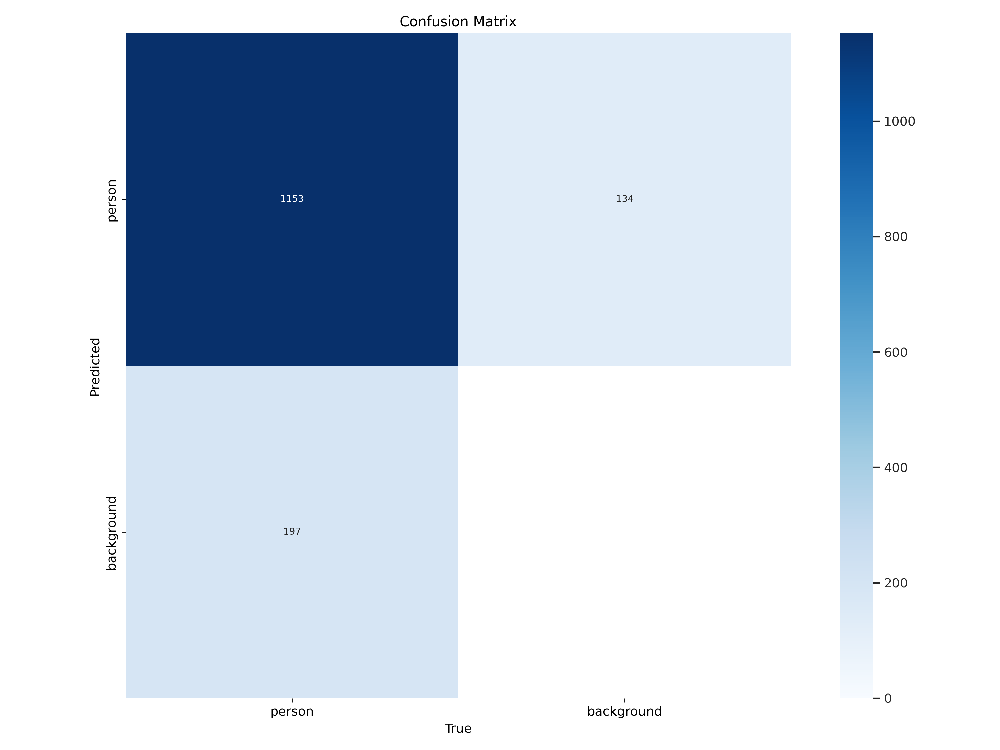

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content/datasets


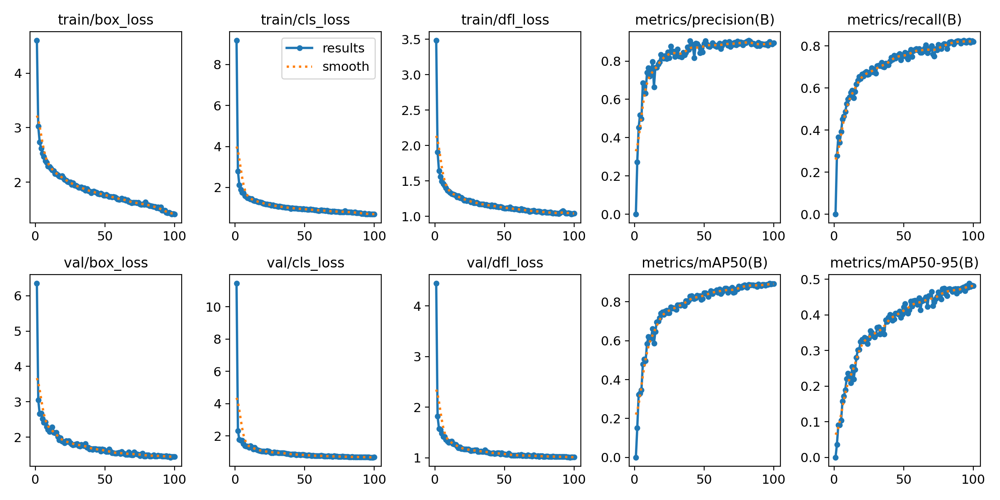

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

/content/datasets


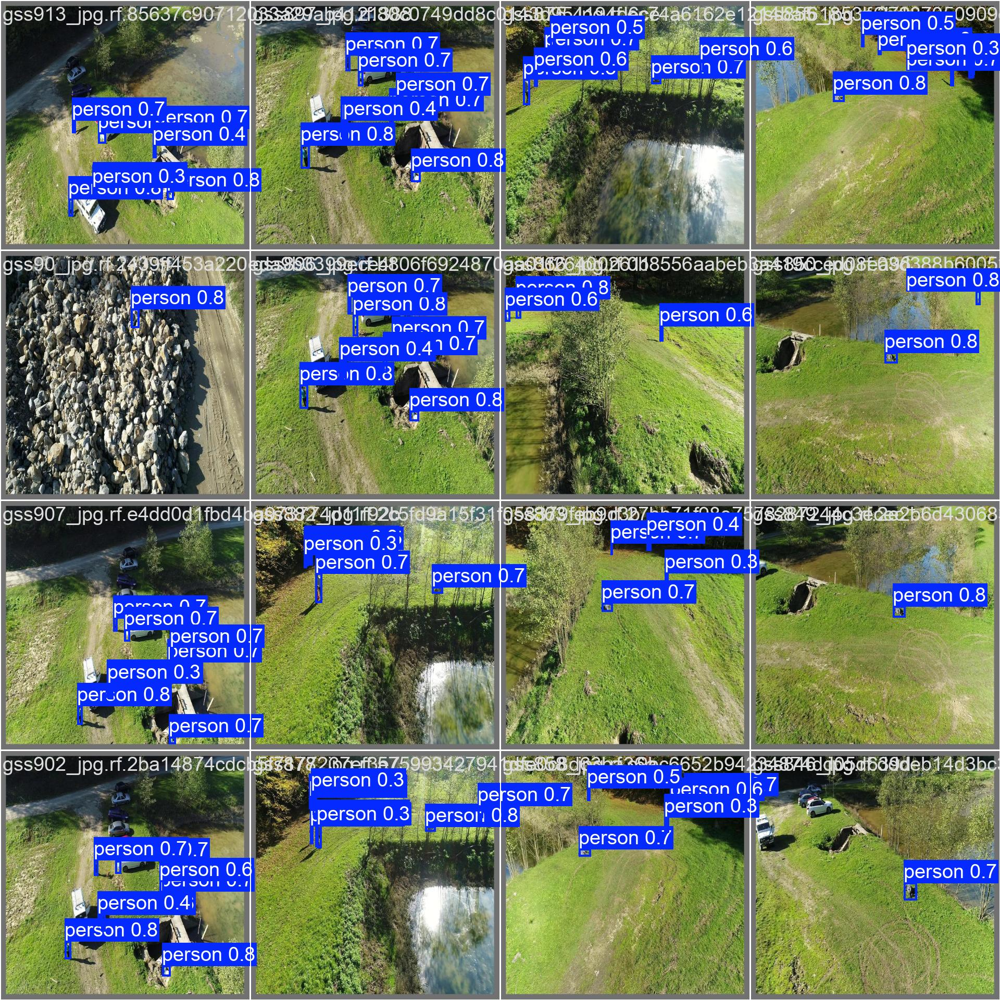

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content/datasets
Ultralytics 8.3.105 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/datasets/datasets/SAR-dataset-1/valid/labels.cache... 396 images, 0 backgrounds, 0 corrupt: 100% 396/396 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 25/25 [00:05<00:00,  4.80it/s]
                   all        396       1350      0.908      0.826      0.897      0.492
Speed: 1.2ms preprocess, 4.4ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content/datasets
Ultralytics 8.3.105 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

image 1/198 /content/datasets/datasets/SAR-dataset-1/test/images/gss1016_jpg.rf.a8d185429b2c8e54f8464f09f11c4e9c.jpg: 640x640 5 persons, 10.3ms
image 2/198 /content/datasets/datasets/SAR-dataset-1/test/images/gss1018_jpg.rf.4b3271160885e93f3aa16a959411ff17.jpg: 640x640 5 persons, 12.7ms
image 3/198 /content/datasets/datasets/SAR-dataset-1/test/images/gss101_jpg.rf.4f33ce51e0ba16900d75968516b27600.jpg: 640x640 1 person, 8.6ms
image 4/198 /content/datasets/datasets/SAR-dataset-1/test/images/gss1035_jpg.rf.6cf5353b486244eb384bfceca79aee99.jpg: 640x640 4 persons, 10.0ms
image 5/198 /content/datasets/datasets/SAR-dataset-1/test/images/gss103_jpg.rf.c4be0a2cae3ebc4df4653dcddf046896.jpg: 640x640 1 person, 7.4ms
image 6/198 /content/datasets/datasets/SAR-dataset-1/test/images/gss1050_jpg.rf.f326d09ed11e995efb5ff7

**NOTE:** Let's take a look at few results.

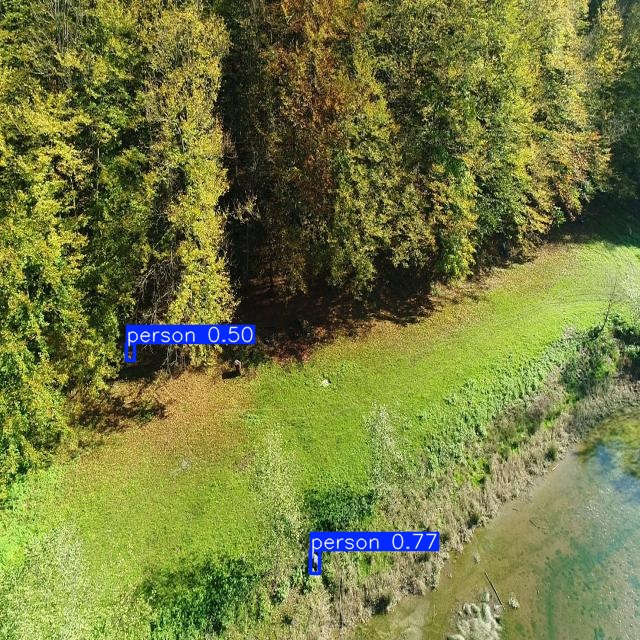

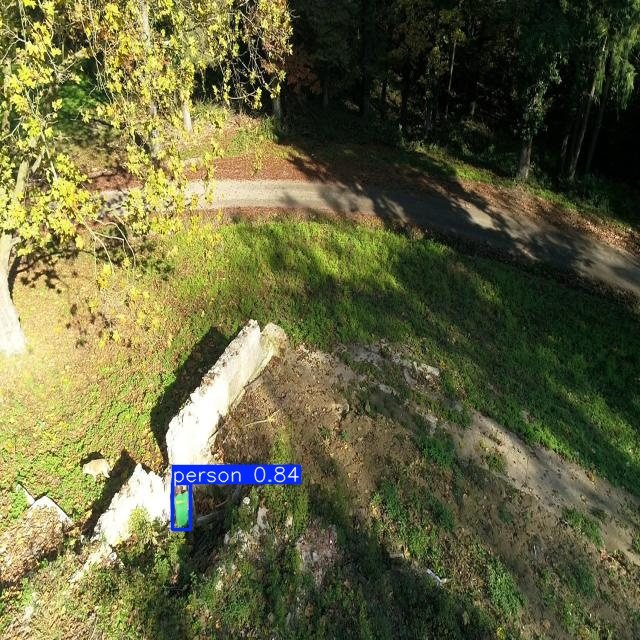

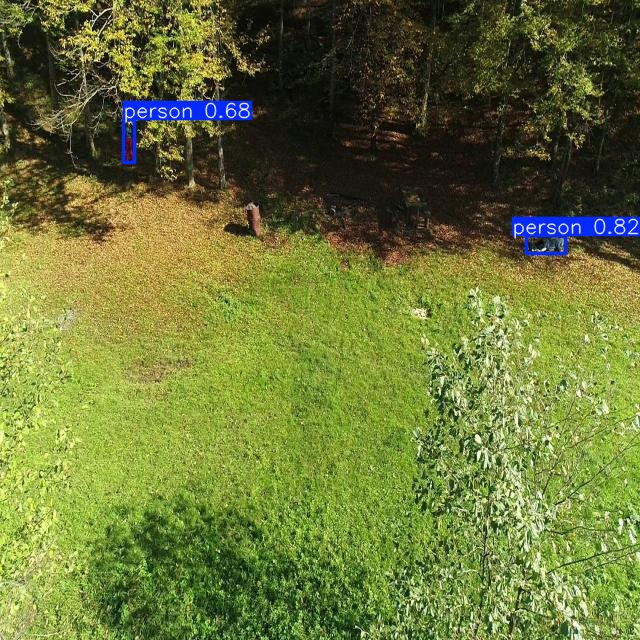

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
# !yolo val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml imgsz=640 batch=36 conf=0.25 iou=0.6 device=0

In [ ]:

!cp {HOME}/runs/detect/train/weights/best.pt /content/drive/MyDrive/sar


In [ ]:

!cp -r {HOME}/runs /content/drive/MyDrive/sar


cp: cannot overwrite non-directory '/content/drive/MyDrive/sar' with directory '/content/datasets/runs'


# detection


In [ ]:

!cp /content/drive/MyDrive/best1.pt /content


cp: cannot stat '/content/drive/MyDrive/best1.pt': No such file or directory
